<a href="https://colab.research.google.com/github/eduardogmarchesan/classificadorDeFrutas/blob/main/ClassificarDeFrutas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Trabalho PDI - Luna, Letícia, João Pedro, Eduardo**

#Imports

In [ ]:
import pandas as pd
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import scipy as sp
import skimage
from scipy import signal
from skimage import transform
import imageio
from skimage import io, transform, util, filters
from skimage.util import montage
from skimage import data, exposure, img_as_float
from scipy.ndimage import convolve
from google.colab import files
import xml.etree.ElementTree as ET
from PIL import Image
from sklearn.preprocessing import MinMaxScaler
from collections import Counter

!git clone https://github.com/eduardogmarchesan/classificadorDeFrutas

fatal: destination path 'classificadorDeFrutas' already exists and is not an empty directory.


#Classes



0.   Apple
1.   Banana
2.   Grape
3.   Jabuticaba
4.   Lemon
5.   Orange
6.   Pear
7.   Strawberry
8.   Tangerine
9.   Tomato



In [ ]:
classNames=['apple', 'banana', 'grape', 'jabuticaba', 'lemon', 'orange', 'pear', 'strawberry', 'tangerine', 'tomato']

#Metadata

In [11]:
metaData = pd.read_csv("classificadorDeFrutas/metadata.csv", index_col = False)
metaData

,ID,Fruit Name,Size,Backgroud,Format
0,0,Apple,6016x4512,Black/White,png
1,1,Banana,6016x4512,Black/White,png
2,2,Grape,6016x4512,Black/White,png
3,3,Jabuticaba,6016x4512,Black/White,png
4,4,Lemon,6016x4512,Black/White,png
5,5,Orange,6016x4512,Black/White,png
6,6,Pear,6016x4512,Black/White,png
7,7,Strawberry,6016x4512,Black/White,png
8,8,Tangerine,6016x4512,Black/White,png
9,9,Tomato,6016x4512,Black/White,png


#Data Anotation



In [12]:
def read_xml_file(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    return root

def process_annotations(root):
    images = []
    for image_elem in root.findall('.//image'):
        image_id = int(image_elem.attrib['id'])
        image_name = image_elem.attrib['name']
        boxes = []
        for box_elem in image_elem.findall('.//box'):
            label = box_elem.attrib['label']
            xtl = float(box_elem.attrib['xtl'])
            ytl = float(box_elem.attrib['ytl'])
            xbr = float(box_elem.attrib['xbr'])
            ybr = float(box_elem.attrib['ybr'])
            boxes.append({'label': label, 'xtl': xtl, 'ytl': ytl, 'xbr': xbr, 'ybr': ybr})
        images.append({'id': image_id, 'name': image_name, 'boxes': boxes})

    return images

xml_file = '/content/classificadorDeFrutas/annotations.xml'
root = read_xml_file(xml_file)
annotations = process_annotations(root)

In [13]:


def display_images(images, classe):
    image_folder = "/content/classificadorDeFrutas/original/" + classe.lower()

    for image_info in images:
        if image_info['boxes'][0]['label'] == classe:
            image_path = f"{image_folder}/{image_info['name']}"
            src = cv2.imread(image_path)
            image = cv2.rotate(src, cv2.ROTATE_180)

            for box_info in image_info['boxes']:
                xtl, ytl, xbr, ybr = map(int, [box_info['xtl'], box_info['ytl'], box_info['xbr'], box_info['ybr']])
                label = box_info['label']
                color = (0, 255, 0) # Green color for bounding boxes
                thickness = 10
                cv2.rectangle(image, (xtl, ybr), (xbr, ytl), color, thickness)
                cv2.putText(image, label, (xtl, ytl - 5), cv2.FONT_HERSHEY_SIMPLEX, 5, color, thickness)

            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.title(f"Image: {image_info['name']}")
            plt.show()

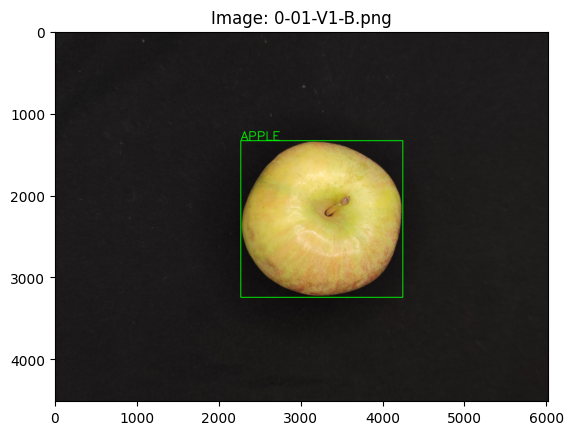

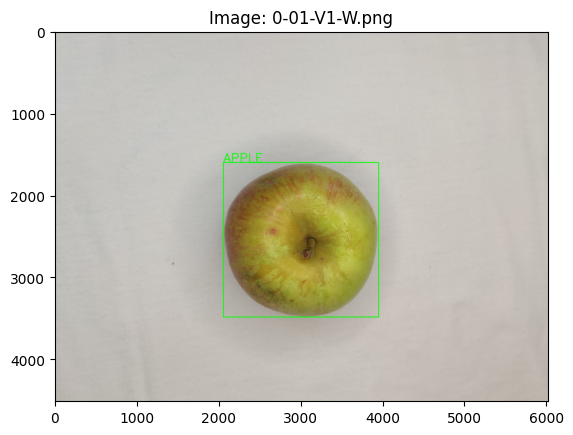

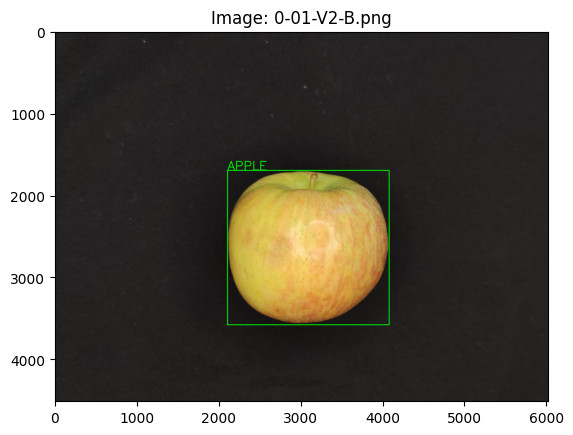

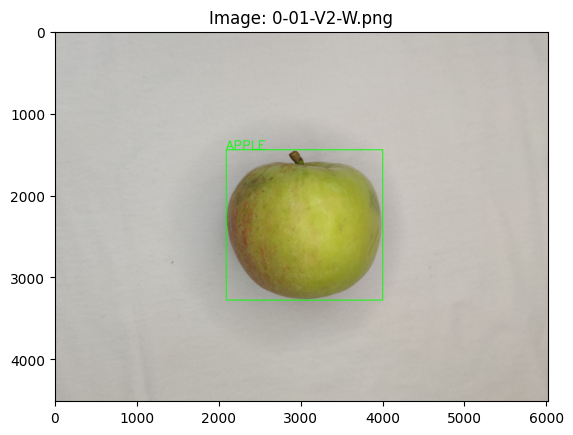

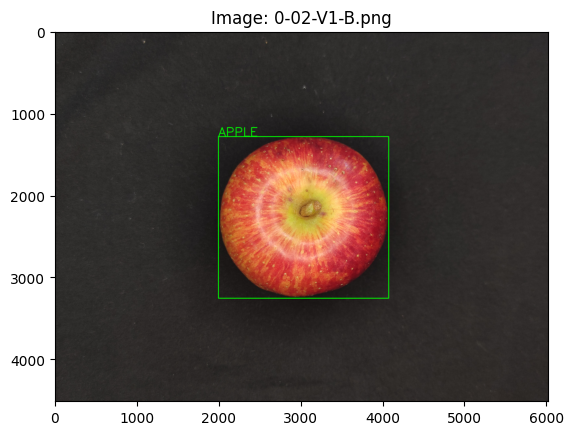

...

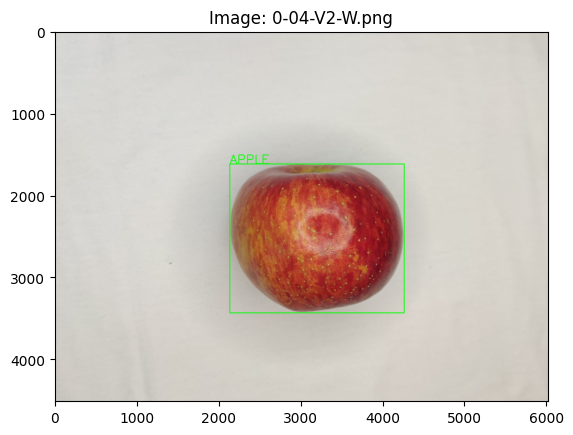

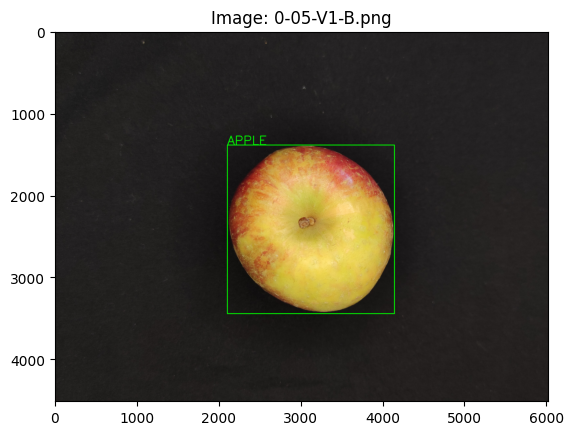

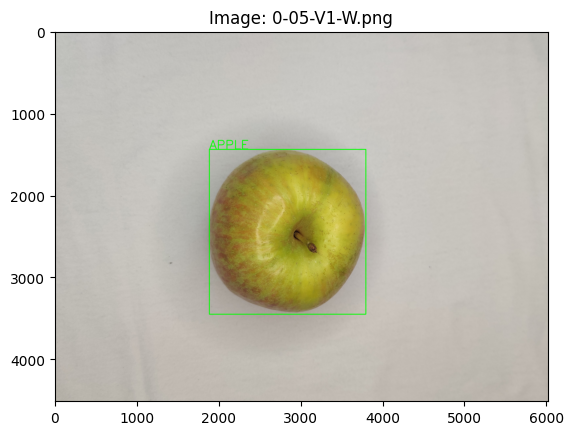

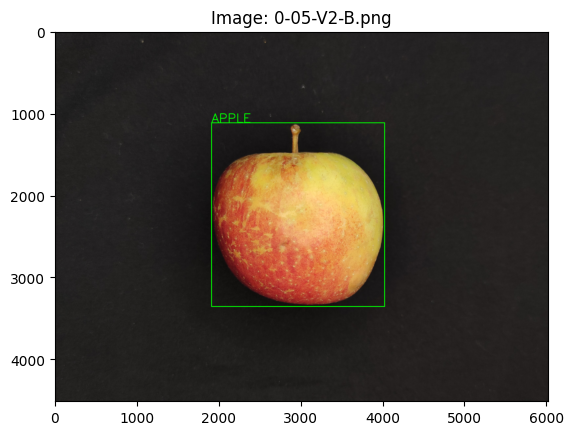

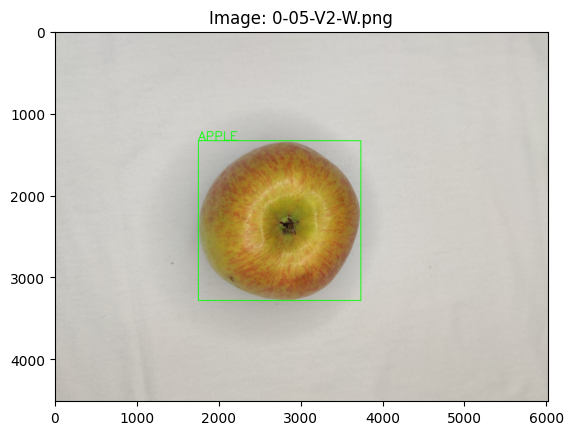

In [14]:
display_images(annotations,"APPLE")

In [ ]:
display_images(annotations,"BANANA")

In [ ]:
display_images(annotations,"GRAPE")

In [ ]:
display_images(annotations,"JABUTICABA")

In [ ]:
display_images(annotations,"LEMON")

In [ ]:
display_images(annotations,"ORANGE")

In [ ]:
display_images(annotations,"PEAR")

In [ ]:
display_images(annotations,"STRAWBERRY")

In [ ]:
display_images(annotations,"TANGERINE")

In [ ]:
display_images(annotations,"TOMATO")

#Display Images

In [15]:
def printImages(directory, name, row, col):
    directory_path = directory
    directory_files = os.listdir(directory_path)
    directory_files.sort()

    images = []
    for file in directory_files:
        img = io.imread(os.path.join(directory_path, file))
        img_resized = transform.resize(img, (600, 800), anti_aliasing=False)
        images.append(img_resized)

    if not images:
        print("No images found in the directory.")
        return

    # Verifica se todas as imagens têm a mesma altura e largura
    #same_shape = all(img.shape == images[0].shape for img in images)

    #if not same_shape:
      #  print("The images do not have the same shape.")
       # return

    montage = util.montage(images, fill=(0, 0, 0), grid_shape=(row, col), channel_axis=3)

    plt.imshow(montage)
    plt.title(name)
    plt.axis("off")

    return images

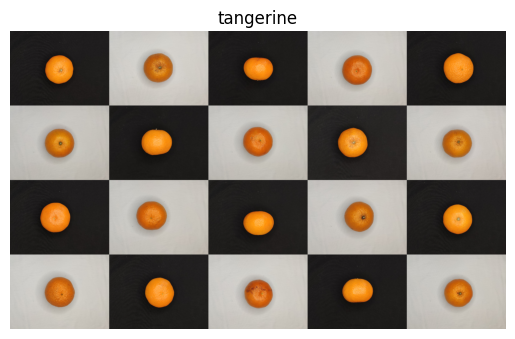

In [16]:
tangerineList = printImages("/content/classificadorDeFrutas/original/tangerine", "tangerine", 4, 5)

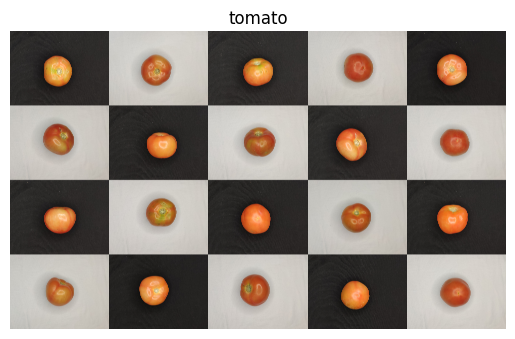

In [ ]:
tomatoList = printImages("/content/classificadorDeFrutas/original/tomato", "tomato", 4, 5)

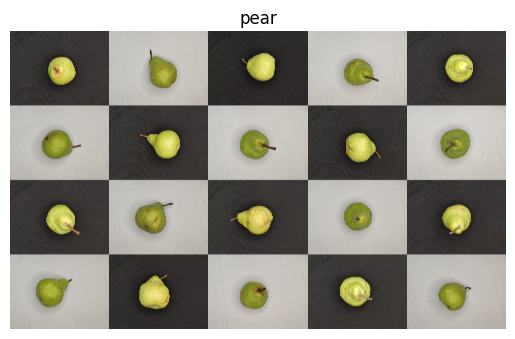

In [ ]:
pearList = printImages("/content/classificadorDeFrutas/original/pear", "pear", 4, 5)

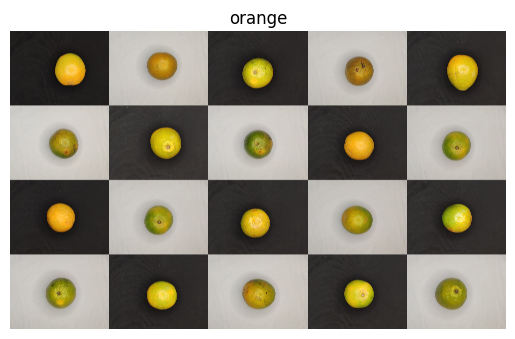

In [ ]:
orangeList = printImages("/content/classificadorDeFrutas/original/orange", "orange", 4, 5)

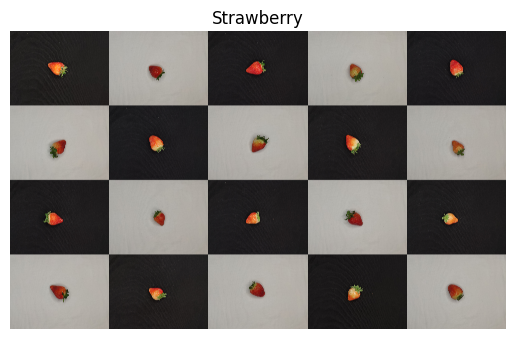

In [ ]:
strawberryList = printImages("/content/classificadorDeFrutas/original/strawberry", "Strawberry", 4, 5)

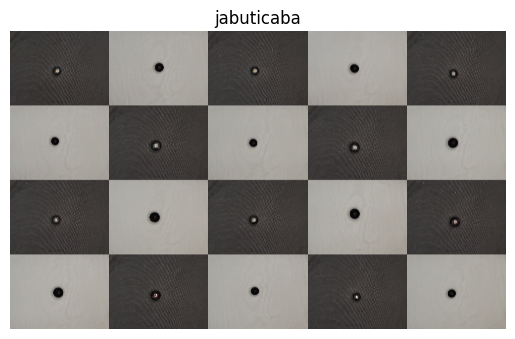

In [ ]:
jabuticabaList = printImages("/content/classificadorDeFrutas/original/jabuticaba", "jabuticaba", 4, 5)

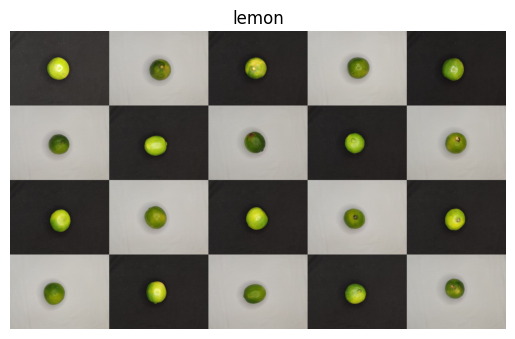

In [ ]:
lemonList = printImages("/content/classificadorDeFrutas/original/lemon", "lemon", 4, 5)

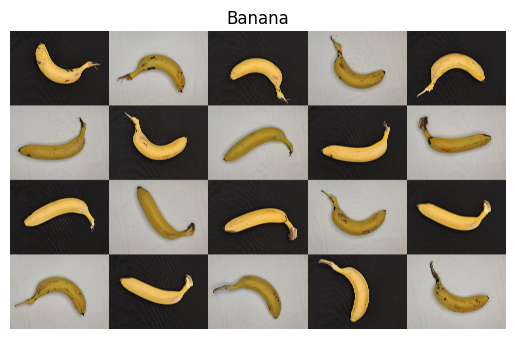

In [ ]:
bananaList = printImages("/content/classificadorDeFrutas/original/banana", "Banana", 4, 5)

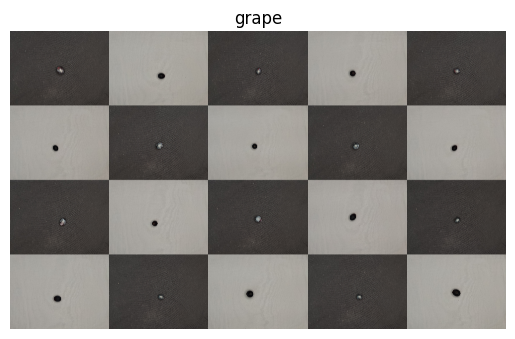

In [ ]:
grapeList = printImages("/content/classificadorDeFrutas/original/grape", "grape", 4, 5)

#Data Augmentation

Não precisa ser executado para classificar. Essa foi a função usada para gerar o data augmantation. As novas imagens já estão sendo carregadas.

In [17]:
def dataAugmentation(directory, name):
    directory_path = directory
    directory_files = os.listdir(directory_path)
    directory_files.sort()

    for file in directory_files:
        img = io.imread(os.path.join(directory_path, file))

        img_resize = transform.resize(img, (600, 800), anti_aliasing=False)
        img_gamma = exposure.adjust_gamma(img_resize, gamma=2, gain=1)
        img_log = exposure.adjust_log(img_resize, gain=1, inv=False)
        img_mean = filters.threshold_local(img_resize, block_size=3, method='mean', offset=0, param=None, cval=0)

        images = [(img_resize, "resize"), (img_gamma, "gamma"), (img_log, "log"), (img_mean, "mean")]

        for img_processed, filename_suffix in images:
            img_float32 = np.float32(img_processed)
            filename = filename_suffix + "-" + file
            cv2.imwrite(filename, cv2.cvtColor(img_float32 * 255, cv2.COLOR_RGB2BGR))
            files.download(filename)



Essa parte foi executada localmente e inserida no git novasFrutas, uma vez que o collab nao funcionou bem com multiplos downloads e a opção de salvar localmente não conversava bem com o git

In [ ]:
dataAugmentation("/content/classificadorDeFrutas/original/apple", 0)
dataAugmentation("/content/classificadorDeFrutas/original/banana", 1)
dataAugmentation("/content/classificadorDeFrutas/original/grape", 2)
dataAugmentation("/content/classificadorDeFrutas/original/jabuticaba", 3)
dataAugmentation("/content/classificadorDeFrutas/original/lemon", 4)
dataAugmentation("/content/classificadorDeFrutas/original/orange", 5)
dataAugmentation("/content/classificadorDeFrutas/original/pear", 6)
dataAugmentation("/content/classificadorDeFrutas/original/strawberry", 7)
dataAugmentation("/content/classificadorDeFrutas/original/tangerine", 8)
dataAugmentation("/content/classificadorDeFrutas/original/tomato", 9)

##Visualização

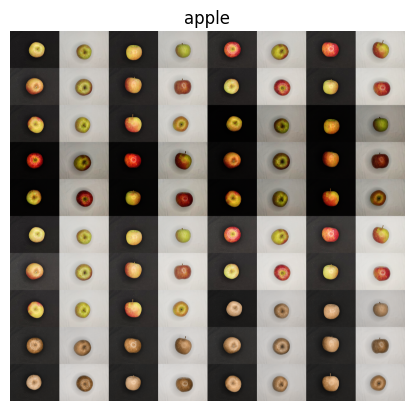

In [18]:
appleListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/apple", "apple", 10, 8)

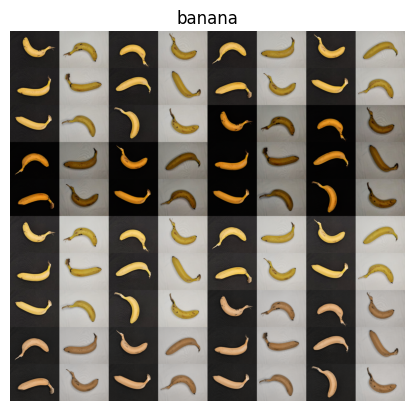

In [ ]:
bananaListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/banana", "banana", 10, 8)

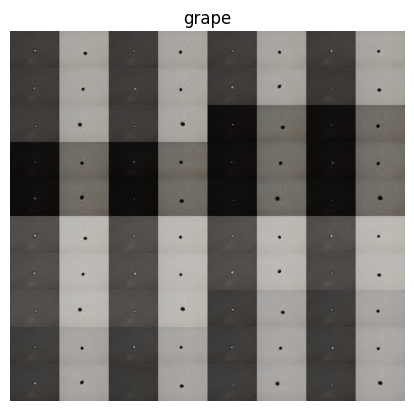

In [ ]:
grapeListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/grape", "grape", 10, 8)

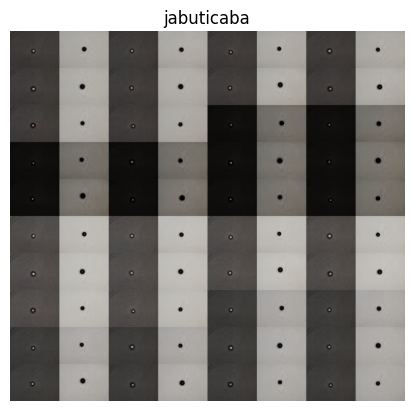

In [ ]:
jabuticabaListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/jabuticaba", "jabuticaba", 10, 8)

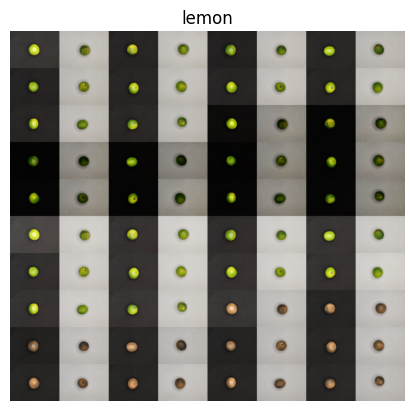

In [ ]:
lemonListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/lemon", "lemon", 10, 8)

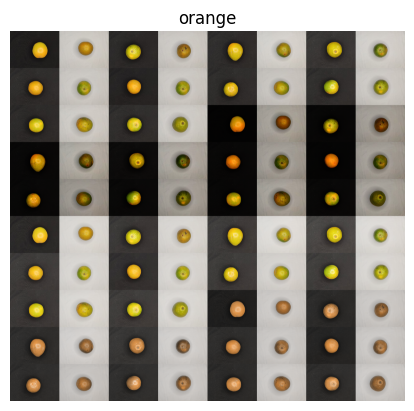

In [ ]:
orangeListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/orange", "orange", 10, 8)

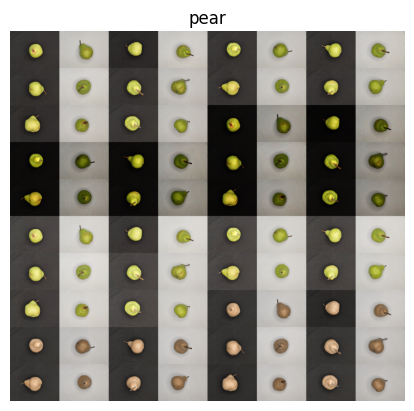

In [ ]:
pearListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/pear", "pear", 10, 8)

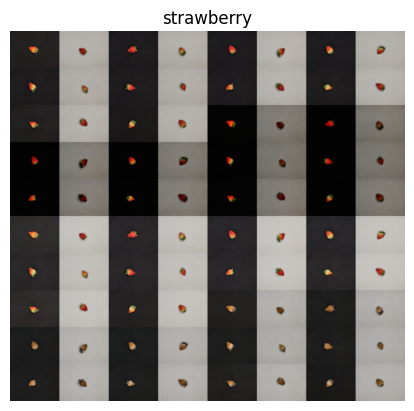

In [ ]:
strawberryListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/strawberry", "strawberry", 10, 8)

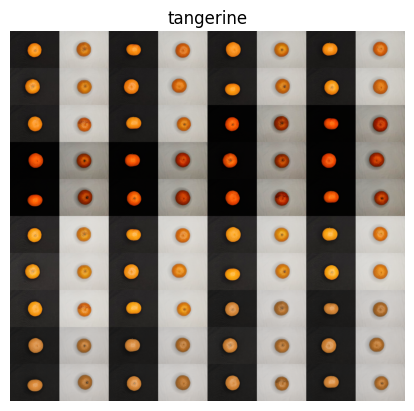

In [ ]:
tangerineListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/tangerine", "tangerine", 10, 8)

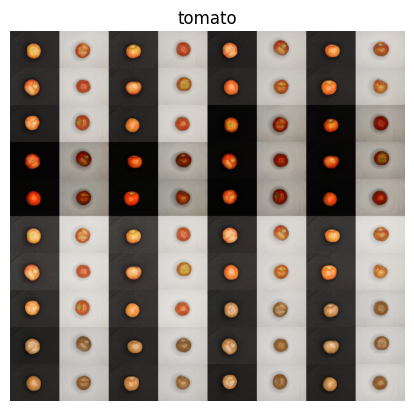

In [ ]:
tomatoListAug = printImages("/content/classificadorDeFrutas/dataAugmentation/tomato", "tomato", 10, 8)

#Data Normalization

In [19]:
def normalization(image):
    img_clipped = np.clip(image, 0, 1)
    newImage = (img_clipped * 255).astype(np.uint8)
    return newImage

In [20]:
def saveLocal(images, folder):
    save_dir = f'{folder}/'
    if not os.path.exists(save_dir):
        os.mkdir(save_dir)
    for i in range(len(images)):
        filename = f'{save_dir}img{i}.png'
        image_normalized = cv2.normalize(images[i], None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        image_rgb = cv2.cvtColor(image_normalized, cv2.COLOR_BGR2RGB)
        cv2.imwrite(filename, image_rgb)

In [21]:
def equali(directory):
    directory_path = directory
    directory_files = os.listdir(directory_path)
    directory_files.sort()

    img_hist = []
    for file in directory_files:
        img = cv2.imread(os.path.join(directory, file))
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_float = img_as_float(gray_img)
        his = exposure.equalize_hist(img_float)
        his2 = exposure.equalize_adapthist(his)
        img_hist.append(normalization(his2))
        del img_float
    return img_hist


In [22]:
appleEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/apple")
bananaEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/banana")
grapeEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/grape")
jabuticabaEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/jabuticaba")
lemonEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/lemon")
orangeEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/orange")
pearEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/pear")
strawberryEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/strawberry")
tangerineEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/tangerine")
tomatoEqualized = equali("/content/classificadorDeFrutas/dataAugmentation/tomato")

In [23]:
if not os.path.exists('/content/classificadorDeFrutas/allEq'):
  os.mkdir('/content/classificadorDeFrutas/allEq')
saveLocal(appleEqualized, '/content/classificadorDeFrutas/allEq/apple')
saveLocal(bananaEqualized, '/content/classificadorDeFrutas/allEq/banana')
saveLocal(grapeEqualized, '/content/classificadorDeFrutas/allEq/grape')
saveLocal(jabuticabaEqualized, '/content/classificadorDeFrutas/allEq/jabuticaba')
saveLocal(lemonEqualized, '/content/classificadorDeFrutas/allEq/lemon')
saveLocal(orangeEqualized, '/content/classificadorDeFrutas/allEq/orange')
saveLocal(pearEqualized, '/content/classificadorDeFrutas/allEq/pear')
saveLocal(strawberryEqualized, '/content/classificadorDeFrutas/allEq/strawberry')
saveLocal(tangerineEqualized, '/content/classificadorDeFrutas/allEq/tangerine')
saveLocal(tomatoEqualized, '/content/classificadorDeFrutas/allEq/tomato')

##Visualização

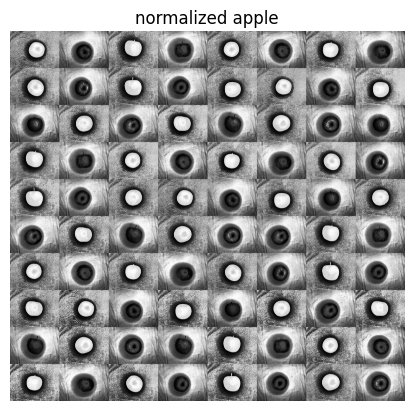

In [24]:
appleListEq = printImages("/content/classificadorDeFrutas/allEq/apple", "normalized apple", 10, 8)

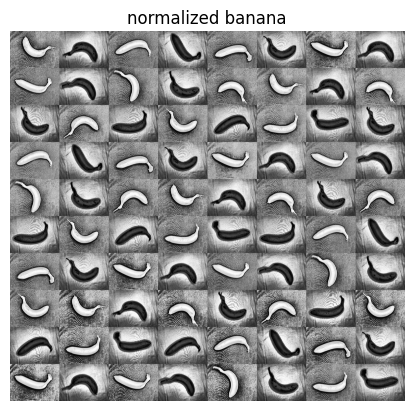

In [ ]:
bananaListEq = printImages("/content/classificadorDeFrutas/allEq/banana", "normalized banana", 10, 8)

In [ ]:
grapeListEq = printImages("/content/classificadorDeFrutas/allEq/grape", "normalized grape", 10, 8)

In [ ]:
jabuticabaListEq = printImages("/content/classificadorDeFrutas/allEq/jabuticaba", "normalized jabuticaba", 10, 8)

In [ ]:
lemonListEq = printImages("/content/classificadorDeFrutas/allEq/lemon", "normalized lemon", 10, 8)

In [ ]:
orangeListEq = printImages("/content/classificadorDeFrutas/allEq/orange", "normalized orange", 10, 8)

In [ ]:
pearListEq = printImages("/content/classificadorDeFrutas/allEq/pear", "normalized pear", 10, 8)

In [ ]:
strawberryListEq = printImages("/content/classificadorDeFrutas/allEq/strawberry", "normalized strawberry", 10, 8)

In [ ]:
tangerineListEq = printImages("/content/classificadorDeFrutas/allEq/tangerine", "normalized tangerine", 10, 8)

In [ ]:
tomatoListEq = printImages("/content/classificadorDeFrutas/allEq/tomato", "normalized tomato", 10, 8)

##Calculando Protótipo Médio

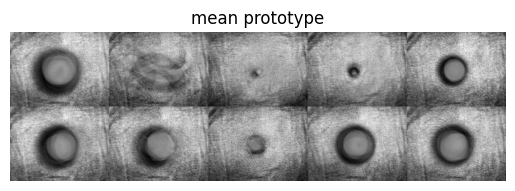

In [25]:
def calculate_mean_prototypes(imgsEqualized):
    imgsEqualized = np.array(imgsEqualized)
    mean_prototype = np.mean(imgsEqualized, axis=0)
    return mean_prototype

appleh = calculate_mean_prototypes(appleEqualized)
bananah = calculate_mean_prototypes(bananaEqualized)
grapeh = calculate_mean_prototypes(grapeEqualized)
jabuticabah = calculate_mean_prototypes(jabuticabaEqualized)
lemonh = calculate_mean_prototypes(lemonEqualized)
orangeh = calculate_mean_prototypes(orangeEqualized)
pearh = calculate_mean_prototypes(pearEqualized)
strawberryh = calculate_mean_prototypes(strawberryEqualized)
tangerineh = calculate_mean_prototypes(tangerineEqualized)
tomatoh = calculate_mean_prototypes(tomatoEqualized)

saveLocal([appleh, bananah, grapeh, jabuticabah, lemonh, orangeh, pearh, strawberryh, tangerineh, tomatoh],'equalizeds')

prototipo_medio = printImages("/content/equalizeds", "mean prototype", 2, 5)


##Calculando Histograma e Variância

In [26]:
def hist(fruit):
  directory_path = '/content/classificadorDeFrutas/allEq/' + fruit
  images = []
  for filename in os.listdir(directory_path):
      if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
          continue
      file_path = os.path.join(directory_path, filename)
      images.append(imageio.imread(file_path))
  histograms = []
  variances = []
  for img in images:
      histogram, _ = np.histogram(img, bins=256, range=(0, 255))
      histograms.append(histogram)
      variance = np.var(histogram)
      variances.append(variance)
  histogram_mean = np.mean(histograms, axis=0)
  variance_mean = np.mean(variances)
  variance_std = np.std(variances)
  plt.bar(range(256), histogram_mean)
  plt.xlabel('Intensity')
  plt.ylabel('Frequency')
  plt.title('Histograma Médio ' + fruit)
  plt.show()
  print('Média da Variância: ', variance_mean)
  print('Desvio Padrão da Variância: ', variance_std)

<ipython-input-26-bc5303d51307>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


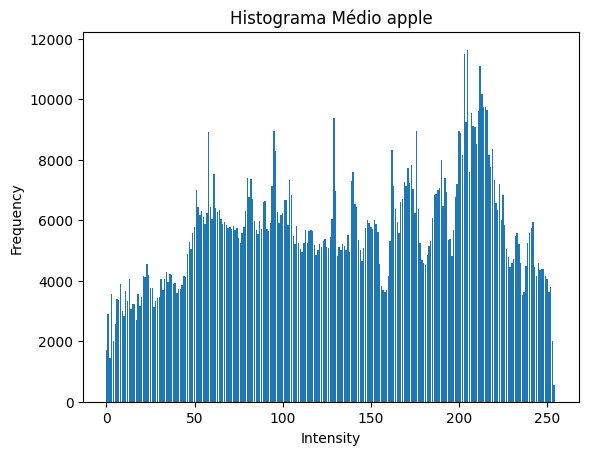

Média da Variância:  88220856.44970703
Desvio Padrão da Variância:  143296211.8614563


In [27]:
hist("apple")

In [ ]:
hist("banana")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


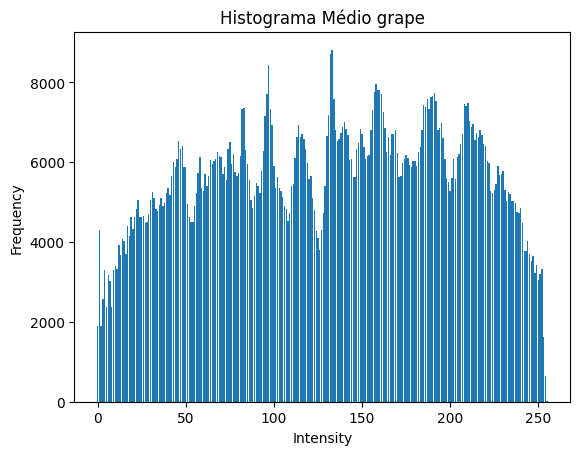

Média da Variância:  32199257.74746094
Desvio Padrão da Variância:  23660571.31406149


In [ ]:
hist("grape")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


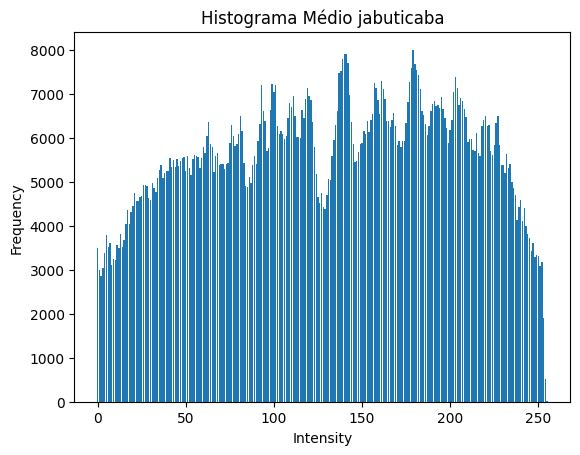

Média da Variância:  28096813.628613282
Desvio Padrão da Variância:  21861130.546637893


In [ ]:
hist("jabuticaba")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


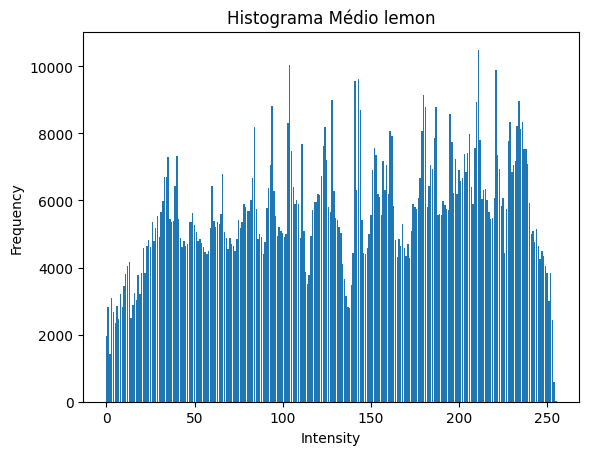

Média da Variância:  127797100.70449218
Desvio Padrão da Variância:  202490504.00585717


In [ ]:
hist("lemon")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


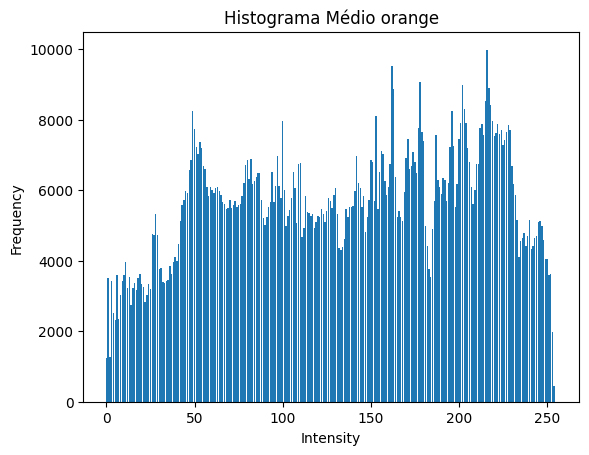

Média da Variância:  76195856.78085938
Desvio Padrão da Variância:  121362471.29050669


In [ ]:
hist("orange")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


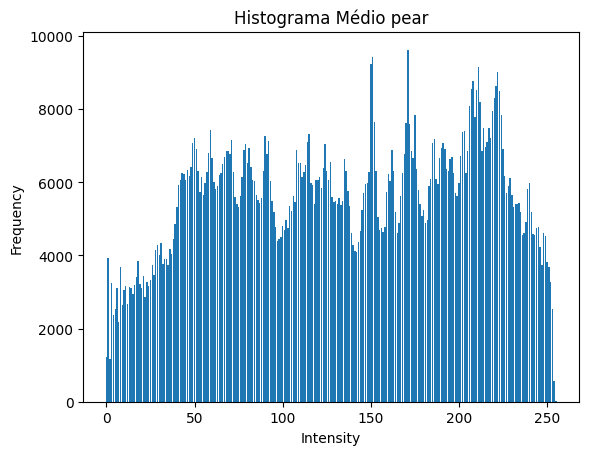

Média da Variância:  55321233.85107422
Desvio Padrão da Variância:  69070699.45996773


In [ ]:
hist("pear")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


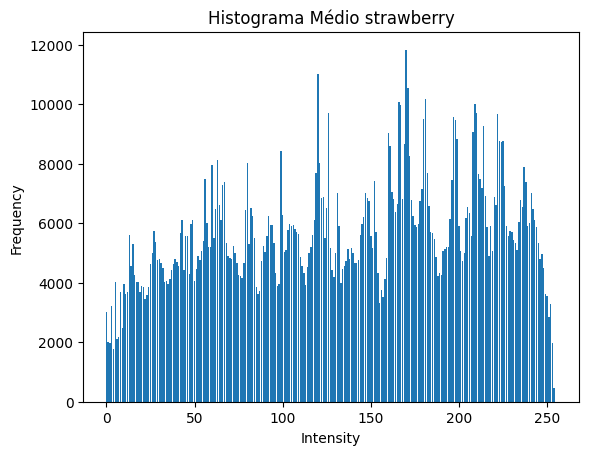

Média da Variância:  148816836.63017577
Desvio Padrão da Variância:  248614139.0359155


In [ ]:
hist("strawberry")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


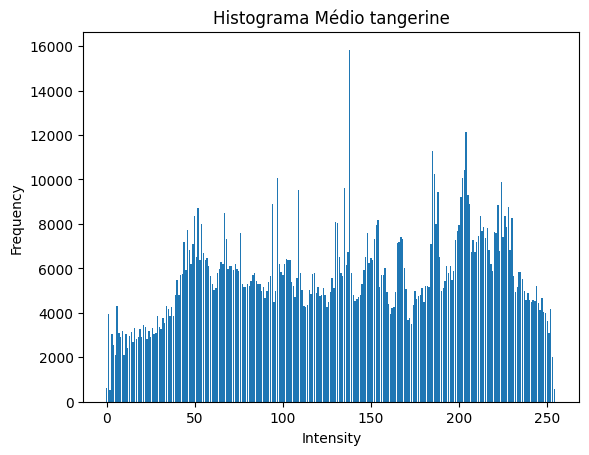

Média da Variância:  139791573.6916992
Desvio Padrão da Variância:  274045025.15543354


In [ ]:
hist("tangerine")

<ipython-input-23-781e0deae747>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(file_path))


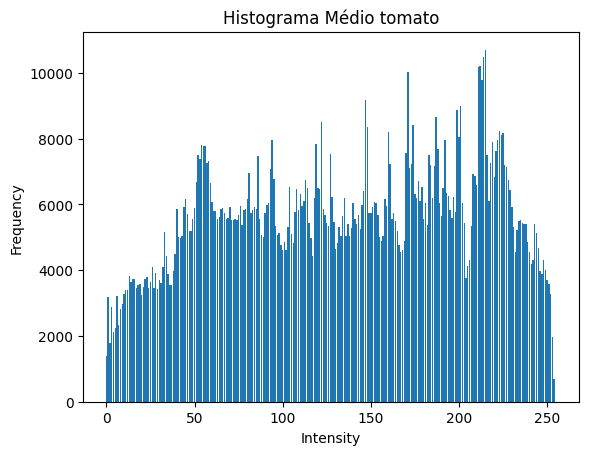

Média da Variância:  84794578.41884765
Desvio Padrão da Variância:  133811689.27967808


In [ ]:
hist("tomato")

#Ground Truth
Não precisa ser executado para classificar.

In [28]:
def printImagesGT(directory, name, row, col):
    directory_path = directory
    directory_files = os.listdir(directory_path)
    directory_files.sort()

    images = []
    for file in directory_files:
        img = io.imread(os.path.join(directory_path, file))
        img_resized = transform.resize(img, (600, 800, 3), anti_aliasing=False)
        #print(img_resized.shape)
        images.append(img_resized)

    if not images:
        print("No images found in the directory.")
        return

    montage = util.montage(images, fill=(0, 0, 0), grid_shape=(row, col), channel_axis=3)

    plt.imshow(montage)
    plt.title(name)
    plt.axis("off")

    return images

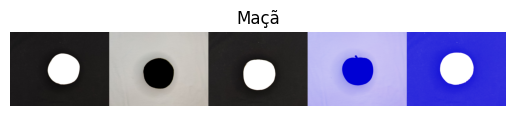

In [29]:
appleListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/apple", "Maçã", 1, 5)

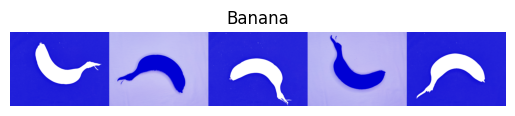

In [ ]:
bananaListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/banana", "Banana", 1, 5)

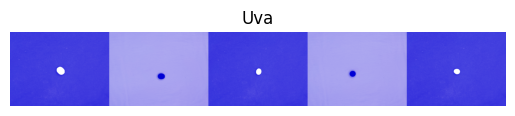

In [ ]:
grapeListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/grape", "Uva", 1, 5)

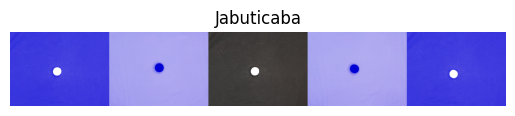

In [ ]:
jabuticabaListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/jabuticaba", "Jabuticaba", 1, 5)

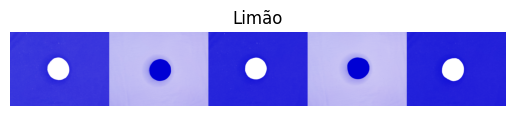

In [ ]:
lemonListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/lemon", "Limão", 1, 5)

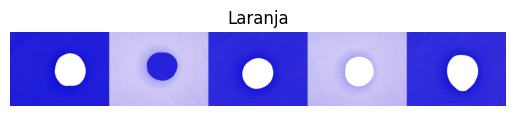

In [ ]:
orangeListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/orange", "Laranja", 1, 5)

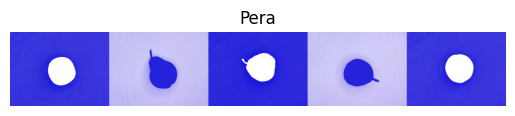

In [ ]:
pearListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/pear", "Pera", 1, 5)

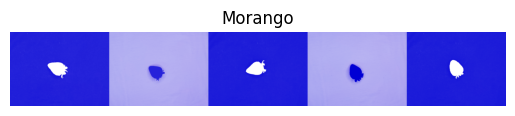

In [ ]:
strawberryListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/strawberry", "Morango", 1, 5)

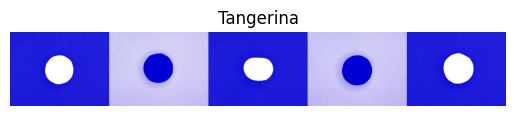

In [ ]:
tangerineListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/tangerine", "Tangerina", 1, 5)

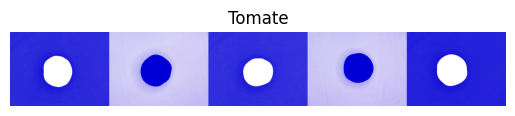

In [ ]:
tomatoListGT = printImagesGT("/content/classificadorDeFrutas/groundTruth/tomato", "Tomate", 1, 5)

#Prepare Data

##Create a dict to store the images and their targests

In [30]:
def prepareImages(directory, target, data):
  directory_path = directory
  directory_files = os.listdir(directory_path)
  directory_files.sort()
  #global data

  for file in directory_files:
    img = skimage.io.imread(directory_path + "/" + file)

    #img_gray = skimage.color.rgb2gray(img)
    data['images'].append(img)
    data["targets"].append(target)

  return data


In [31]:
data = dict()
data['images'] = []
data['targets'] = []

target_names = ["Apple","Banana", "Grape", "Jabuticaba","Lemon","Orange","Pear", "Strawberry", "Tangerine", "Tomato"]

data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/apple", 0, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/banana", 1, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/grape", 2, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/jabuticaba", 3, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/lemon", 4, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/orange", 5, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/pear", 6, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/strawberry", 7, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/tangerine", 8, data)
data = prepareImages("/content/classificadorDeFrutas/dataAugmentation/tomato", 9, data)

##Reshape de dict to the sk-learn format

In [32]:
#copy the data to a numpy array

X = np.array(data['images'])
Y = np.array(data['targets'])

n_samples = len(X)
dataFinal = X.reshape((n_samples, -1)) # flatten the images

print(f'n_samples:{n_samples} data shape:{dataFinal.shape}')


n_samples:800 data shape:(800, 1440000)


##Split data between train and test

In [33]:
from sklearn.model_selection import train_test_split

# Split data into 80% train and 20% test subsets
X_train, X_test, y_train, y_test = train_test_split(
    dataFinal, Y, test_size=0.2, shuffle=True
)

print(f'Train data -> type:{type(X_train)} shape:{X_train.shape} size:{X_train.size}\n')
print(f'Test data  -> type:{type(X_test)} shape:{X_test.shape} size:{X_test.size}\n')

Train data -> type:<class 'numpy.ndarray'> shape:(640, 1440000) size:921600000

Test data  -> type:<class 'numpy.ndarray'> shape:(160, 1440000) size:230400000



#Training Methods

Execute only one cell of this section


##Nearest Neighbors

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier(n_neighbors=3)

clf.fit(X_train, y_train)  # Learning

predicted = clf.predict(X_test)

##SVC

In [ ]:


from sklearn import svm

clf = svm.SVC(C = 1000)  # Create a classifier C-Support Vector Classifier (SVC)


#print(f'type: {type(clf)}')

clf.fit(X_train, y_train)  # Learning

predicted = clf.predict(X_test)

##Random Forest

(works on colab)



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
#X_train, y_train = make_classification(n_samples=1000, n_features=4,
 #                           n_informative=2, n_redundant=0,
 #                           random_state=0, shuffle=False)


clf = RandomForestClassifier(n_estimators=200, max_depth=50, random_state=0)


clf.fit(X_train, y_train)

predicted = clf.predict(X_test)

##Decision Tree

(Tekes too long)

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0, criterion="entropy")

clf.fit(X_train, y_train)

predicted = clf.predict(X_test)


#Classification Metrics




Print some images and the predict result

In [ ]:

_, axes = plt.subplots(nrows=1, ncols=20, figsize=(60, 80))


for ax, image, prediction in zip(axes, X_test, predicted):
    ax.set_axis_off()
    image = image.reshape(600, 800,3)
    ax.imshow(image, interpolation="nearest")
    ax.set_title(target_names[prediction])

##Print the Classification Metrics

In [ ]:
from sklearn import metrics

print(
    f"Classification report for classifier {clf}:\n"
    f"{metrics.classification_report(y_test, predicted,target_names=target_names)}\n"
)

##Print the Confusion Matrix

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, predicted)
cmd = ConfusionMatrixDisplay(cm, display_labels=target_names)

cmd.plot(xticks_rotation='vertical')